# Modelling the addition of a battery into home solar system:
***
**Battery of interest:**   Enphase Encharge 10  
        *Spec Sheet: https://enphase.com/sites/default/files/downloads/support/Encharge-10-DS-EN-US.pdf*

OUTPUT (AC) @ 240 VAC¹:
>         Rated (continuous) output power² 3.84 kVA  
        Peak output power 5.7 kVA (10 seconds)  
        Nominal voltage / range 240 / 211 — 264 VAC  
        Nominal frequency / range 60 / 57 — 61 Hz
        Rated output current 16 A
        Peak output current 24.6A (10 seconds)
        Power factor (adjustable) 0.85 leading ... 0.85 lagging
        Maximum units per 20 A branch circuit 1 unit (single phase)
        Interconnection Single-phase
        Maximum AC short circuit fault current over 3 cycles 69.6 Arms
        Round trip efficiency² 89%
        
BATTERY:
>         Total capacity 10.5 kWh
        Usable capacity 10.08 kWh
        Round trip efficiency 96%  
        Nominal DC voltage 67.2 V
        Maximum DC voltage 73.5 V
        Ambient operating temperature range -15º C to 55º C (5º F to 131º F) non-condensing
        Optimum operating temperature range 0º C to 30º C (32º F to 86º F)
        Chemistry Lithium iron phosphate (LFP)>
        
Limited Warranty(3):
>        >70% capacity, up to 10 years or 4000 cycles

Foot Notes:
1. Supported in backup/off grid operations
2. AC to Battery to AC at 50% power rating.
3. Whichever occurs first. Restrictions apply

### My assumptions based on these specs:
#### Efficiencies:
- one way efficiency = $\sqrt{\text{Round Trip Efficiency}}$  
- 98.0% DC charging effeciency from solar (assuming it does not have to be inverted and uninverted)
- 94.3% AC charging efficiency from grid  
- 94.3% AC discharge efficiency to home  
- Actual max output power = Apparent max (kWA) * Power Factor 
    - 3.84 (kVA) * 50% = 1.92kW
    - (i got 50% from footnote 2 above)

#### Worst Case Battery Life Span:
- Usable capacity drops by 30% over 10 years or 4k cycles
    - you lose: $\frac{30\text{%}}{4k Cycles}$ $\text{= 0.0075% per 1 cycle}$
- What defines a 'cycle'?
    - From enphase community forum [here](https://community.enphase.com/s/question/0D52G00004NITyPSAX/your-warranty-for-the-storage-system-is-4000-cycles-or-10-years-whichever-comes-first-how-do-you-calculate-each-cycle-if-i-never-fully-discharge-and-i-charge-and-discharge-on-small-phases-how-do-i-keep-track-of-this-in-my-elighthen-app-to-see-expiratio):
> The 4000 cycle is 4000 full cycle, which is equivalent to 2.8MWh AC energy throughput per kWh of rated capacity over the warranty period. This is equal to 9,408 kWh throughput per Encharge 3 base unit and 28,224 kWh throughput per Encharge 10.
>
>You can see the lifetime energy discharged from your system in the Enlighten App, in Energy Page, by selecting the “Life Time” on the top of the page. Compare the life time Discharged energy to the warrantied throughput (9,408 kWh per Encharge 3 base unit kWh).

    - So I interpret this to mean that each cycle is counted when you've used 28.224 MWh of AC energy
        - 28,224 kWh (usable AC) = 2,800 kWh ($\frac{\text{usable AC kWh}}{\text{DC kWh}}$) * 10.080 kWh (DC kWh)
- For the sake of this model this means that for every 28,224 kWh pulled from the battery I need to reduce my usable capacity by 0.0075%
   
   That can't be right...
    - instead:
        - 4k cycles = 28,224 kWh  
        - 1 cycle = 28,224/4000 = 7kWh

### Questions:
* Do i need to add inverter losses? or is this baked into the 'AC Round Trip Efficiency'

- chat w/ Travis
    - Enphase Packs has microinverters packaged inside
    - efficiency assumptions
        - Prod numbers are after being inverted?
        - charging
            - 0.943
        - discharging
            - 0.943
     
### Still To Do:
- Factor in capicity decrease over time into max charge capacity
- Factor in max current output and input for the battery
- Factor in what we don't sell back to the grid - do we need to? 


### Generator Alternatives:

Bermy Quotes:
- https://www.facebook.com/Bermuda-Electric-Generators-103247934411677/photos/a.103251671077970/476672477069219

Generac 10kW:
- https://www.northerntool.com/shop/tools/product_200736934_200736934
- 10,000 Surge Watts, 8000 Rated Watts
- $999.00 in US
- ~2k in Berm

Generac 5802 XG 10000-Running-Watt Gasoline Portable Generator
- https://www.homedepot.com/p/XG-10-000-Watt-Gasoline-Powered-Electric-Start-Portable-Generator-5802/202322589  
- $ 2299.00 in US   

- $ 5,160.00 delivered in BDA

PowerHorse 9kW:  
- https://www.northerntool.com/shop/tools/product_200664810_200664810
- 9000 Surge Watts, 7250 Rated Watts
- $929.99 in US
- ~2k in Berm


In [54]:
import pandas as pd
import numpy as np
from dataclasses import dataclass
import holoviews as hv
import hvplot
import hvplot.pandas
import matplotlib.pyplot as plt
import pytz
from datetime import timedelta

%matplotlib inline
plt.style.use('ggplot')
pd.options.display.max_rows = 10

NameError: name 'ggplot' is not defined

### Import Historical Data:

In [2]:
pd.set_option('display.max_rows',10)

raw_df = pd.read_csv('./enphase-data-2019-2020.csv')


raw_df.drop(columns='Unnamed: 0',inplace=True)
raw_df.rename(columns={'Date/Time':'time',
                   'Energy Produced (Wh)':'prod',
                   'Energy Consumed (Wh)':'cons',
                   'Exported to Grid (Wh)':'exp',
                   'Imported from Grid (Wh)':'imp'}, inplace=True)

raw_df['time'] = pd.to_datetime(raw_df['time'],utc=True)
raw_df.time = raw_df.time.dt.tz_convert('Atlantic/Bermuda')
raw_df.sort_values(by='time',inplace=True,ignore_index=True)
raw_df.set_index('time',inplace=True)

## Plotting Unconstrained Battery Level
---
To get an initial look at the data and how 'balanced' our house energy system is i'm going to model an unconstrained battery into the system to see if it ultimately ends up being very over-charged or very over-dischared over the various seasons and years.

**What do I mean by how balanced our house energy system is?**   
*how close does our overproduction from solar during the day match what we consume during non-production hours throughout the year.*

**What is an unconstrained battery?**
*an unconstrained battery in this case is a battery with infinitely large capacty and no limitations on how fast you can charge or discharge it. In my case i'm going to start at an initial battery level of 0 and see if it ends up being ultimately more discharged or charged from it's startling level*

In [3]:
df = raw_df.copy()

plot_scale_factor = 5
df['unconst_batt_level'] = (df['prod'].cumsum() - df['cons'].cumsum()) / plot_scale_factor

shift_val = -4 # used to account for the delay on the EWM moving average

line_alpha = 0.5
line_width = 1
line_color = 'black'

text_size = '8pt'
text_alpha = 0.8
text_color = 'gray'

line1 = hv.VLine(pd.to_datetime('3/1/2019'))
line2 = hv.VLine(pd.to_datetime('6/1/2019'))
line3 = hv.VLine(pd.to_datetime('9/1/2019'))
line4 = hv.VLine(pd.to_datetime('12/1/2019'))
line5 = hv.VLine(pd.to_datetime('3/1/2020'))
line6 = hv.VLine(pd.to_datetime('6/1/2020'))
line7 = hv.VLine(pd.to_datetime('9/1/2020'))
line8 = hv.VLine(pd.to_datetime('12/1/2020'))

# Setting option defaults wasn't working.. do it the long way
line1.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line2.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line3.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line4.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line5.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line6.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line7.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)
line8.opts(color=line_color, line_dash='dashed', line_width= line_width, alpha= line_alpha)

text1 = hv.Text(pd.to_datetime('4/15/2019'),-5e5,'SPRING')
text2 = hv.Text(pd.to_datetime('7/15/2019'),-5e5,'SUMMER')
text3 = hv.Text(pd.to_datetime('10/15/2019'),-5e5,'FALL')
text4 = hv.Text(pd.to_datetime('1/15/2020'),-5e5,'WINTER')
text5 = hv.Text(pd.to_datetime('4/15/2020'),-5e5,'SPRING')
text6 = hv.Text(pd.to_datetime('7/15/2020'),-5e5,'SUMMER')
text7 = hv.Text(pd.to_datetime('10/15/2020'),-5e5,'FALL')


text1.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text2.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text3.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text4.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text5.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text6.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)
text7.opts(text_color=text_color, text_alpha=text_alpha, text_font_size=text_size)

df.rename(columns={'cons':'Consumption (Wh)','prod':'Production (Wh)'},inplace=True)

plot1 = df.drop(columns=['exp',
                 'imp',
                 'unconst_batt_level']).resample('W').sum().ewm(span=20).mean().shift(shift_val).hvplot.line(
    hover_line_alpha=0.6,
    grid=True,
    width=900,
    height=400)

plot2 = df.drop(columns=['exp','imp','Consumption (Wh)','Production (Wh)']).hvplot.area(alpha=0.2,
                                                         line_color='green',
                                                         color='green',
                                                         label=('Unconstrained Battery Capacity'),
                                                        ylabel='Energy (Wh) (Battery is scaled to fit)',
                                                                title='Unconstrained Battery Level over 2 years')

plots = plot1 * plot2
lines = line1 * line2 * line3 * line4 * line5 * line6 * line7 * line8 
text = text1 * text2 * text3 * text4 * text5 * text6 * text7

plots * lines * text

#hv.help(hv.Text)

:Overlay
   .NdOverlay.I                         :NdOverlay   [Variable]
      :Curve   [time]   (value)
   .Area.Unconstrained_Battery_Capacity :Area   [time]   (unconst_batt_level)
   .VLine.I                             :VLine   [x,y]
   .VLine.II                            :VLine   [x,y]
   .VLine.III                           :VLine   [x,y]
   .VLine.IV                            :VLine   [x,y]
   .VLine.V                             :VLine   [x,y]
   .VLine.VI                            :VLine   [x,y]
   .VLine.VII                           :VLine   [x,y]
   .VLine.VIII                          :VLine   [x,y]
   .Text.I                              :Text   [x,y]
   .Text.II                             :Text   [x,y]
   .Text.III                            :Text   [x,y]
   .Text.IV                             :Text   [x,y]
   .Text.V                              :Text   [x,y]
   .Text.VI                             :Text   [x,y]
   .Text.VII                            :Text   [x,y]

### Takeaways:
- You can clearly see the seasonal cycles in the production
- Consumption was was relatively flat until Summer 2020 when it jumped significantly
    - best guess for this jump is that it's a result of more occupants in the house (COVID-19..) using more AC in the summer and more hot water in the winter
- Unconstrained Battery
    - the battery was trending to be net over-charged before the jump in consumption in Summer 2020
    - after the jump the battery capacity was steadily discharging

## Now to constrain the battery:
---

Here I am going to create a battery class to store battery specs as well as the functions that will control how the battery behaves with the system.

Battery behaviour psuedo-code: 
 - if (production > consumption)
     - if (battery_level > min_level) & (battery_level < max_level)
         - charge
     - else 
         - export to grid
 - else if (production < consumption)
     - if (battery_level > min_level) & (battery_level < max_level)
         - discharge
     - else 
         - import from grid

In [4]:
@dataclass
class Battery:
    DEBUG = False; # used for debug print statements 
    PRINT_OUTPUT = False;
    
    #------------------------------------ BATTERY SPECS ------------------------------------------
    #            All default specs are for the enphase 10kWh battery spec'd above
    
    # Capacity Specs:
    actual_full_batt_cap : int = 10080
    min_capacity_allowed : float = 0.05 # %
    empty_batt_cap : int = actual_full_batt_cap * min_capacity_allowed
    
    # Battery Life Specs:
    capacity_drop_per_cycle : float = 0.000075 # 0.0075%
    num_cycles_in_warranty : int = 4000
    
    full_warranty_energy_per_kwh : int = 2800
    energy_per_cycle : float = actual_full_batt_cap * full_warranty_energy_per_kwh / num_cycles_in_warranty
        
    # Efficiency Specs:
    charge_eff : float = 0.943
    discharge_eff : float = 0.943
    
    # Output Specs:
    nominal_voltage = 67.2 # Volts
    power_factor : float = 1 # From Travis
    apparent_max_ouput_va : float = 3840
    actual_max_output_w : float = apparent_max_ouput_va * power_factor
    actual_max_output_15min_wh = actual_max_output_w * 0.25
    
    # Charging Specs:
    max_charge_current = 16 # Amps
    max_charge_power = max_charge_current * nominal_voltage # Watts
    max_charge_wh_in_15mins = max_charge_power * 0.25 # 15 mins x 1 hr / 60 mins = 0.25
    
    
    # Energy Cost Assumptions
    import_cost_per_mega_watt : int  = 360 # $
    export_price_per_mega_watt : int = 220 # $
    # TODO: factor in export price?
    
    #------------------------------------ BATTERY METHODS ------------------------------------------
    class Decorators:
        def get_prev_row_decorator(func):
            prev_row = {}

            def wrapper(batt_ref, curr_row, df_res, *args, **kwargs):

                batt = batt_ref
                bl_col = args[0]
                e_col = args[1]
                i_col = args[2]

                val = func(batt_ref, curr_row, prev_row, bl_col, e_col, i_col)
                
                prev_row.update(curr_row)
                prev_row[bl_col] = val[0]
                prev_row[e_col] = val[1]
                
                if ((curr_row.row_num+1) == df_res.index.size):
                    prev_row.clear()
                    
                return val
            return wrapper

    
    @Decorators.get_prev_row_decorator
    def t_apply_function(self, curr_row, prev_row, bl_col, e_col, i_col):

        ret_val = pd.Series(None,index=['curr_batt_level',
                                        'new_import',
                                        'new_export',
                                        'discharge_total',
                                        'over'],
                            dtype=object)
        
        net_energy = curr_row['prod'] - curr_row['cons']
        batt_full = self.actual_full_batt_cap
        batt_empty = self.empty_batt_cap
        batt_level = prev_row.get(bl_col,self.actual_full_batt_cap)
        charge_eff = self.charge_eff
        discharge_eff = self.discharge_eff
        max_output = self.actual_max_output_15min_wh
        max_charge_rate = self.max_charge_wh_in_15mins

        # Energy Surpluss
        if net_energy > 0: 
            ret_val = self._handle_charging(ret_val, net_energy, batt_level, batt_full, charge_eff, max_charge_rate)   

        # Energy Deficit
        else: 
            ret_val = self._handle_disharging(ret_val,
                                              net_energy,
                                              batt_level,
                                              batt_empty,
                                              discharge_eff,
                                              max_output)

        return ret_val

    def set_capacity (self, new_capacity):
        benchmark_capacity = 10000 # for 10kWh pack spec'd above
        
        self.init_full_batt_cap = new_capacity
        self.actual_full_batt_cap = new_capacity
        self.empty_batt_cap = new_capacity * self.min_capacity_allowed
        self.energy_per_cycle = new_capacity * self.full_warranty_energy_per_kwh / self.num_cycles_in_warranty
        
        
        self.max_charge_current = 16 * new_capacity / benchmark_capacity # Amps
        self.max_charge_power = self.max_charge_current * self.nominal_voltage # Watts
        self.max_charge_wh_in_15mins = self.max_charge_power * 0.25 # 15 mins x 1 hr / 60 mins = 0.25

        self.apparent_max_ouput_va = 3840 * new_capacity / benchmark_capacity
        self.actual_max_output_w = self.apparent_max_ouput_va * self.power_factor
        self.actual_max_output_15min_wh = self.actual_max_output_w * 0.25

    def _handle_charging(self, ret_val, net_energy, batt_level, batt_full, charge_eff, max_charge_rate):
        # if Battery is not full -> charge it
        if batt_level < batt_full:

            energy_req_to_fill = (batt_full - batt_level) / charge_eff

            # if max charge rate is exceeded 
            if net_energy > max_charge_rate:
                self._handle_max_charge_exceeded(ret_val,
                                                net_energy,
                                                energy_req_to_fill,
                                                max_charge_rate,
                                                charge_eff,
                                                batt_full,
                                                batt_level)
            
            
            # if Battery won't over charge -> charge the full amount
            elif net_energy < energy_req_to_fill:  
                ret_val['curr_batt_level'] = batt_level + (net_energy * charge_eff)
                ret_val['new_import'] = 0
                ret_val['new_export'] = 0
                ret_val['discharge_total'] = 0
                ret_val['over'] = 0
                if (self.DEBUG): print('charging battery to below full')

            else: # if Battery would overcharge -> charge to full and export the rest
                ret_val['curr_batt_level'] = batt_full
                ret_val['new_import'] = 0
                ret_val['new_export'] = net_energy - energy_req_to_fill
                ret_val['discharge_total'] = 0
                ret_val['over'] = 0
                if (self.DEBUG): print('charging full and exporting')

        # if Battery is full -> export all excess energy
        else:
            ret_val['curr_batt_level'] = batt_level
            ret_val['new_import'] = 0
            ret_val['new_export'] = net_energy
            ret_val['discharge_total'] = 0
            ret_val['over'] = 0
            if (self.DEBUG): print('battery already full')

        return ret_val

    def _handle_max_charge_exceeded(self,
                                    ret_val,
                                    net_energy,
                                    energy_req_to_fill,
                                    max_charge_rate,
                                    charge_eff,
                                    batt_full,
                                    batt_level):
        
        # if battery is still not full at this rate -> the max in the battery and export teh rest
        if max_charge_rate < (batt_full - batt_level):  
            ret_val['curr_batt_level'] = batt_level + max_charge_rate
            ret_val['new_import'] = 0
            ret_val['new_export'] = net_energy - (max_charge_rate / charge_eff)
            ret_val['discharge_total'] = 0
            ret_val['over'] = 0
            if (self.DEBUG): print('max charge rate exceeded, battery still not full')
                    
        # fill the battery and export the rest
        else: 
            ret_val['curr_batt_level'] = batt_full
            ret_val['new_import'] = 0
            ret_val['new_export'] = net_energy - ((batt_full - batt_level) / charge_eff)
            ret_val['discharge_total'] = 0
            ret_val['over'] = 0
            if (self.DEBUG): print('max charge rate exceeded, battery is full')
            
    

    def _handle_disharging(self, ret_val, net_energy, batt_level, batt_empty, discharge_eff, max_output):
        usable_batt_level = batt_level - batt_empty
        # if Battery is not full discharged -> discharge it
        if usable_batt_level > 0:

            energy_req_for_cons = net_energy / discharge_eff
            
            # if battery won't over discharge -> check if demand is greater than max battery output
            if abs(energy_req_for_cons) < usable_batt_level:
                    
                # if demand is above output max -> only discharge at max allowed rate and import the rest
                if self._output_max_exceeded(energy_req_for_cons,max_output):
                    self._handle_output_max_exceeded(ret_val,
                                                     batt_level,
                                                     energy_req_for_cons,
                                                     max_output,
                                                     net_energy,
                                                     batt_empty,
                                                     usable_batt_level,
                                                     discharge_eff)
                
                # if demand does not exceed max ouput power -> take all energy from the battery
                else:
                    ret_val['curr_batt_level'] = batt_level + energy_req_for_cons
                    ret_val['new_import'] = 0
                    ret_val['new_export'] = 0
                    ret_val['discharge_total'] = -energy_req_for_cons
                    ret_val['over'] = 0
                    if (self.DEBUG): print('discharging below max and within batt level')
                
                    
            
            else: # if battery would over discharge -> check for peak output power then empty battery and import the rest
                
                # if demand is above output max -> only discharge at max allowed rate and import the rest
                if self._output_max_exceeded(energy_req_for_cons,max_output):
                    self._handle_output_max_exceeded(ret_val,
                                                     batt_level,
                                                     energy_req_for_cons,
                                                     max_output,
                                                     net_energy,
                                                     batt_empty,
                                                     usable_batt_level,
                                                     discharge_eff)
                    
                else:
                    ret_val['curr_batt_level'] = batt_empty
                                          # energy needed - energy out of the battery 
                    ret_val['new_import'] = -net_energy - (usable_batt_level * discharge_eff)
                    ret_val['new_export'] = 0
                    ret_val['discharge_total'] = usable_batt_level
                    ret_val['over'] = 0
                    if (self.DEBUG): print('emptying battery and importing')

        # if Battery is fully discharged -> import the energy needed it
        else:
            ret_val['curr_batt_level'] = batt_level
            ret_val['new_import'] = -net_energy
            ret_val['new_export'] = 0
            ret_val['discharge_total'] = 0
            ret_val['over'] = 0
            if (self.DEBUG): print('battery already empty')
        return ret_val

    def _output_max_exceeded(self, energy_req_for_cons, max_output):
        return abs(energy_req_for_cons) > max_output
        
    def _handle_output_max_exceeded(self,
                                    ret_val,
                                    batt_level,
                                    energy_req_for_cons,
                                    max_output,
                                    net_energy,
                                    batt_empty,
                                    usable_batt_level,
                                    discharge_eff):
        
        # if battery won't be empty
        if (usable_batt_level > max_output) or (usable_batt_level > abs(energy_req_for_cons)):
            ret_val['curr_batt_level'] = batt_level - max_output 
            ret_val['new_import'] = -net_energy - (max_output * discharge_eff)
            ret_val['new_export'] = 0
            ret_val['discharge_total'] = max_output
            ret_val['over'] = -net_energy - max_output
            if (self.DEBUG): print('discharging above max but battery still has capacity')
        
        # else: battery will be emptied
        else:
            ret_val['curr_batt_level'] = batt_empty 
            ret_val['new_import'] = -net_energy - (usable_batt_level * discharge_eff)
            ret_val['new_export'] = 0
            ret_val['discharge_total'] = usable_batt_level
            ret_val['over'] = -net_energy - usable_batt_level
            if (self.DEBUG): print('discharging above max past empty battery')
        

    def _print_model_results(self):
        print('********************** MODEL RUN **********************')
        print('Capacity: ', self.actual_full_batt_cap,'\n')
        print('Cycles per Year: \t', "{:.1f}".format(self.cycles_per_year)," cycles")
        print('Capcity Drop: \t\t', "{:.2f}".format(self.capacity_drop_per_year*100), "% per year (worst case)")
        print('End of Warranty: \t', "{:.1f}".format(self.time_until_eowarranty)," years")
        print('Old import Total: \t', "{:.1f}".format(self.old_import_total)," MW")
        print('New Import Total: \t', "{:.1f}".format(self.new_import_total)," MW")
        print('Import Difference: \t', "{:.3f}".format(self.import_diff)," MW per year")
        print('Import Cost Savings: \t$', "{:.2f}".format(self.import_cost_savings)," per year")
        print('Export Revenue Drop: \t$', "{:.2f}".format(self.export_revenue_drop)," per year\n")
        print('Net Savings: \t\t$', "{:.2f}".format(self.net_annual_cost_savings)," per year")
        print('************************* END *************************')
        print('\n')

    def run_battery_model(self, df):
        bl_col = 'curr_batt_level'
        e_col = 'new_export'
        i_col = 'new_import'
    
        df['row_num'] = np.arange(len(df))            
        temp = df.apply(self.t_apply_function, args=[df, bl_col, e_col, i_col], axis=1)
        if 'row_num' in df:
            del df['row_num']
        
        df[i_col] = temp[i_col]
        df[e_col] = temp[e_col]
        df[bl_col] = temp[bl_col]
        df['discharge_total'] = temp['discharge_total']
        df['over']= temp['over']

        num_years = 2

        if self.energy_per_cycle > 0:
            self.cycles_per_year = df['discharge_total'].sum()/(self.energy_per_cycle) / num_years
        else:
            self.cycles_per_year = 0
            
        self.capacity_drop_per_year = self.capacity_drop_per_cycle * self.cycles_per_year
        self.time_until_eowarranty = 4000/self.cycles_per_year
        self.new_import_total = df['new_import'].sum()/1e6 # in  in MW
        self.old_import_total = df['imp'].sum()/1e6 # in  in MW
        self.import_diff = (self.old_import_total - self.new_import_total) /  num_years # in  in MW
        self.export_diff = (df['exp'].sum() - df['new_export'].sum())/1e6 / num_years # in MW
        self.import_cost_savings = self.import_cost_per_mega_watt * self.import_diff
        self.export_revenue_drop = self.export_price_per_mega_watt * self.export_diff
        self.net_annual_cost_savings = self.import_cost_savings - self.export_revenue_drop

        if (self.PRINT_OUTPUT): self._print_model_results()

        return df



    

In [5]:
def plot_model(pdf,scaling_factor=1,title=None):
    pdf['batt_level_div10'] = pdf['curr_batt_level']/scaling_factor

    plot = pdf.drop(columns=['exp',
                             'imp',
                             'curr_batt_level',
                             'discharge_total',
                             'over',
                             'batt_level_div10']).hvplot.line(title=title,alpha=.6) * \
    pdf.drop(columns=['exp',
                     'imp',
                     'cons',
                     'prod',
                     'new_export',
                     'new_import',
                     'discharge_total',
                     'over',
                     'curr_batt_level']).hvplot.area(alpha=0.1,
                                                     line_color='green',
                                                     color='green',
                                                     label='batt_level_div10') 
    return plot

In [6]:
df_10 = raw_df[:10000].copy()
batt_10kwh = Battery()
batt_10kwh.set_capacity(1000)
res_10kwh = batt_10kwh.run_battery_model(df_10)

In [7]:
plot_model(res_10kwh,5)

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [time]   (value)
   .Area.Batt_level_div10 :Area   [time]   (batt_level_div10)

In [8]:
def run_backup_analysis(battery, peak_output_w, df_date_range, outage_duration):
    
    battery.actual_max_output_15min_wh = peak_output_w * 0.25 # converting to wh in 15 mins
    
    ret_val = pd.DataFrame(columns=['day', 'days_to_drain','drains','batt_min'])
    
    df_trimmed = trim_data_range_to_full_days(df_date_range)
    
    num_periods = find_num_outage_periods_in_date_range(df_trimmed, outage_duration)
    
    for outage in range(num_periods):

        df_outage = get_next_outage_range(df_trimmed, outage, outage_duration) 
        model_res = battery.run_battery_model(df_outage)
        
        days_to_first_drain = find_days_to_first_drain(model_res)
        total_num_drains = find_num_drains(model_res, battery.empty_batt_cap)
        
        
        
        ret_val.loc[outage] = [df_outage.iloc[0].name] + \
                              [days_to_first_drain] + \
                              [total_num_drains] + \
                              [model_res.curr_batt_level.min()]

    return ret_val.set_index('day',drop=True)

def find_days_to_first_drain(df):
     return (df[df.curr_batt_level == df.curr_batt_level.min()].iloc[0].name - df.index[0]).days

def find_num_drains(df, empty_batt):
    df['prev_batt_level'] = df['curr_batt_level'].shift(1)
    df['prev_x2_batt_level'] = df['prev_batt_level'].shift(1)
    
    # Adding the second prev value check reduces the amount of "bouncing" around empty this drain counter counts
    df['drains'] = np.where(
        (df.curr_batt_level == empty_batt) & 
        (df.prev_batt_level > df.curr_batt_level) & 
        (df.prev_x2_batt_level > df.curr_batt_level),1,0)

    return df['drains'].sum()

def get_next_outage_range(df, outage_num, outage_duration):
    df.reset_index(inplace=True)
    start = df[df['time'] == (df['time'].iloc[0] + timedelta(days=outage_num))].iloc[0].name
    end = df[df['time'] == (df['time'].iloc[0] + timedelta(days=(outage_num+outage_duration)))].iloc[0].name  
    ret_val = df[start : end].copy()
    ret_val.set_index('time',inplace=True, drop=True)
    df.set_index('time',inplace=True, drop=True)
    return ret_val
    
def trim_data_range_to_full_days(df):
    df.reset_index(inplace=True)
    start = df[(df['time'].dt.hour == 0) & (df['time'].dt.minute == 0)].iloc[0]
    end = df[(df['time'].dt.hour == 0) & (df['time'].dt.minute == 0)].iloc[-1]
    ret_val = df[start.name : end.name].copy()
    ret_val.set_index('time',inplace=True, drop=True)
    df.set_index('time',inplace=True, drop=True)
    return ret_val

        
def find_num_outage_periods_in_date_range(df, outage_duration):
    num_days = (df.iloc[-1].name - df.iloc[0].name).round('D').days
    return  num_days - outage_duration

# improvements:
# - make the power outage start a random point in teh day



df = raw_df[:10000].copy()

battery = Battery()
peak_output_w = 1000
outage_duration = 6

res = run_backup_analysis(battery, peak_output_w, df, outage_duration)



In [49]:
df = raw_df.copy()
#df = raw_df[:10000].copy()

battery = Battery()
battery.set_capacity(16000)
peak_output_w = battery.actual_max_output_w / 2
print(peak_output_w)
outage_duration = 6

res = run_backup_analysis(battery, peak_output_w, df, outage_duration)

model_results = battery.run_battery_model(df)


(res.days_to_drain*500).hvplot.line() * plot_model(model_results,10)

3072.0


:Overlay
   .Curve.Days_to_drain   :Curve   [day]   (days_to_drain)
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [time]   (value)
   .Area.Batt_level_div10 :Area   [time]   (batt_level_div10)

# Backup Analysis
---

**Goal:**  Figure how long I can expect to keep the lights on during an outage with various battery sizes and power budgets

*Approach 1:*
- find the power budget that would keep the battery from fully discharging at any point within a week for every day in my data...

*Approach 2:*
- find the time to first dead battery if the power were to go out at each of the days within my data period



In [10]:
df = raw_df.copy()
df_weekly = df.resample('W').sum()

*Need to be careful about incomplete weeks when resampling:*

In [11]:
df_weekly['count'] = df['prod'].resample('W').count()

# Check to see what week counts are off
low_count_weeks = df_weekly[(df_weekly['count'] < 672) | (df_weekly['count'] > 672)]    
# Turns out it's the first and last incomplete weeks as well as daylightsavings switches

# drop the first and last weeks
df_weekly = df_weekly[1:]
df_weekly = df_weekly[:-1]

In [12]:
wh_to_mw = 1e-6
wh_to_kw = 1e-3

# create a week class to store specs and specific weeks
class Week():
    pass

Finding the Best and Worst **Consumption** Weeks:

In [13]:
df.reset_index(inplace=True)
df['new_index'] = df['time']
df.set_index('new_index',inplace=True,drop=True)

w_cons_week = Week()
w_cons_week.cons = df_weekly['cons'].max()
w_cons_week.end_date = df_weekly[df_weekly['cons'] == w_cons_week.cons].index

b_cons_week = Week()
b_cons_week.cons = df_weekly['cons'].min()
b_cons_week.end_date = df_weekly[df_weekly['cons'] == b_cons_week.cons].index

# grab the full resolution data from the worst consumption week
w_cons_week_df = df[(df['time'] > pd.to_datetime('7/26/20',utc=True)) & \
   (df['time'] < pd.to_datetime('8/2/20',utc=True))]

w_cons_plot = w_cons_week_df.hvplot.line(title='Worst Consumption Week')

b_cons_week_df = df[(df['time'] > pd.to_datetime('1/19/20',utc=True)) & \
   (df['time'] < pd.to_datetime('1/26/20',utc=True))]

b_cons_plot = b_cons_week_df.hvplot.line(title='Best Consumption Week')

w_cons_plot

:NdOverlay   [Variable]
   :Curve   [new_index]   (value)

In [14]:
b_cons_plot

:NdOverlay   [Variable]
   :Curve   [new_index]   (value)

## Best and Worst Production Weeks:
---

In [15]:
w_prod_week = Week()
w_prod_week.prod = df_weekly['prod'].min()
w_prod_week.end_date = df_weekly[df_weekly['prod'] == w_prod_week.prod].index

b_prod_week = Week()
b_prod_week.prod = df_weekly['prod'].max()
b_prod_week.end_date = df_weekly[df_weekly['prod'] == b_prod_week.prod].index

b_prod_week_df = df[(df['time'] > pd.to_datetime('4/28/19',utc=True)) & \
   (df['time'] < pd.to_datetime('5/5/19',utc=True))]

b_prod_plot = b_prod_week_df.hvplot.line(title='Best Production Week')

w_prod_week_df = df[(df['time'] > pd.to_datetime('12/20/20',utc=True)) & \
   (df['time'] < pd.to_datetime('12/27/20',utc=True))]

w_prod_plot = w_prod_week_df.hvplot.line(title='Worst Production Week')

In [16]:
b_prod_plot

:NdOverlay   [Variable]
   :Curve   [new_index]   (value)

In [17]:
w_prod_plot

:NdOverlay   [Variable]
   :Curve   [new_index]   (value)

### Now to model a battery over some of these standout weeks:

In [18]:
b_cons_week_df = b_cons_week_df.copy()
batt_16kwh = Battery()
batt_16kwh.set_capacity(16000)

res_16kwh = batt_16kwh.run_battery_model(b_cons_week_df)
plot_model(res_16kwh,10,title='Best Consumption Week vs 16kWh Battery')

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [new_index]   (value)
   .Area.Batt_level_div10 :Area   [new_index]   (batt_level_div10)

Turns out the best consumption week was a terrible production week...

What about the best case scenario where we merge the best production week with the best consumption week:

In [19]:
b_cons_b_prod_df = b_cons_week_df
b_cons_b_prod_df['prod'] = b_prod_week_df['prod'].values

res_16kwh = batt_16kwh.run_battery_model(b_cons_b_prod_df)
plot_model(res_16kwh,10,title='Best Cons & Best Prod Week vs 16kWh Battery')

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [new_index]   (value)
   .Area.Batt_level_div10 :Area   [new_index]   (batt_level_div10)

Still a little disapointing.. but I guess it's unsurprising that we'd need to ration our power usage in an outage situation. Let's look at one of the hurricanes from last year for a different real world scenario:

**Let's say we had lost power for a long period after Hurricane Paulette last year:**

In [20]:
paulette_df = df[(df['time'] > pd.to_datetime('9/15/20',utc=True)) & \
   (df['time'] < pd.to_datetime('9/27/20',utc=True))]

paulette_df = paulette_df.copy()
res_16kwh = batt_16kwh.run_battery_model(paulette_df)
plot_model(res_16kwh,10,title='Paulette vs 16kWh Battery')

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [new_index]   (value)
   .Area.Batt_level_div10 :Area   [new_index]   (batt_level_div10)

In [43]:
paulette_by_3_df = paulette_df.copy()
paulette_by_3_df['cons'] = paulette_by_3_df['cons'] / 3


res_16kwh_c_by_3 = batt_16kwh.run_battery_model(paulette_by_3_df)
plot_model(res_16kwh_c_by_3,10,title='Paulette at 30% Consumption vs 16kWh Battery')

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [new_index]   (value)
   .Area.Batt_level_div10 :Area   [new_index]   (batt_level_div10)

In [46]:
paulette_by_5_df = paulette_df.copy()
paulette_by_5_df['cons'] = paulette_by_5_df['cons'] / 5

res_16kwh = batt_16kwh.run_battery_model(paulette_by_5_df)
plot_model(res_16kwh,10,title='Paulette at 20% Consumption vs 16kWh Battery')

:Overlay
   .NdOverlay.I           :NdOverlay   [Variable]
      :Curve   [new_index]   (value)
   .Area.Batt_level_div10 :Area   [new_index]   (batt_level_div10)

## Looking at Production & Consumption Seasonality trends:
***


First let's look at the distribution for production throughout this 2 year span

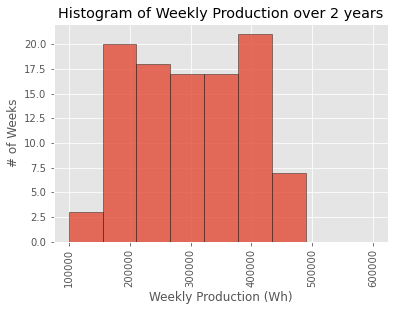

In [84]:
lower_bound = 1e5
upper_bound = 6e5
num_bins = 10

bins = np.linspace(lower_bound, upper_bound, num_bins)
plt.hist(df_weekly['prod'].values, bins=bins, edgecolor="k",alpha=0.8)
plt.title("Histogram of Weekly Production over 2 years")
plt.xlabel("Weekly Production (Wh)")
plt.ylabel("# of Weeks")
plt.xticks(rotation=90)

plt.show()

Looks like there might be multiple distributions in here for the different season

In [85]:
df_weekly_summer_half = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month > 3) & (df_weekly.reset_index().time.dt.month < 10)]

df_weekly_winter_half = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month <= 3) | (df_weekly.reset_index().time.dt.month >= 10)]

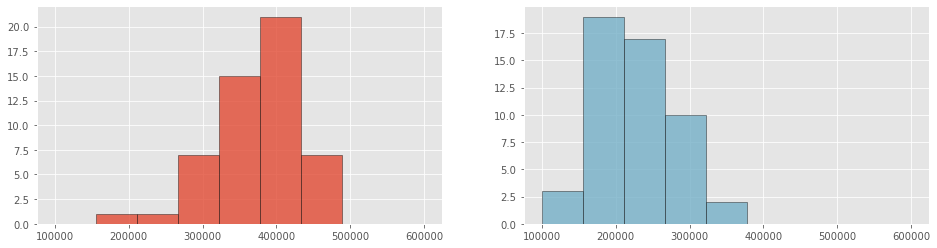

In [86]:
fig, axes = plt.subplots(1,2,figsize=(16,4))
axes[0].hist(df_weekly_summer_half['prod'].values,
             bins=bins,
             edgecolor="k",
             stacked=True,
            alpha=0.8)

axes[1].hist(df_weekly_winter_half['prod'].values,
             bins=bins,
             edgecolor="k",
             stacked=True,
             color='#75B0C7',
            alpha=0.8)
plt.show()

Looking a little more "normal" now.


### What about each of the 4 seasons:

In [87]:
df_weekly_winter_quarter = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month >= 12) | (df_weekly.reset_index().time.dt.month < 3)]

df_weekly_spring_quarter = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month >= 3) & (df_weekly.reset_index().time.dt.month < 6)]

df_weekly_summer_quarter = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month >= 6) & (df_weekly.reset_index().time.dt.month < 9)]

df_weekly_fall_quarter = \
    df_weekly.reset_index()[(df_weekly.reset_index().time.dt.month >= 9) & (df_weekly.reset_index().time.dt.month < 12)]

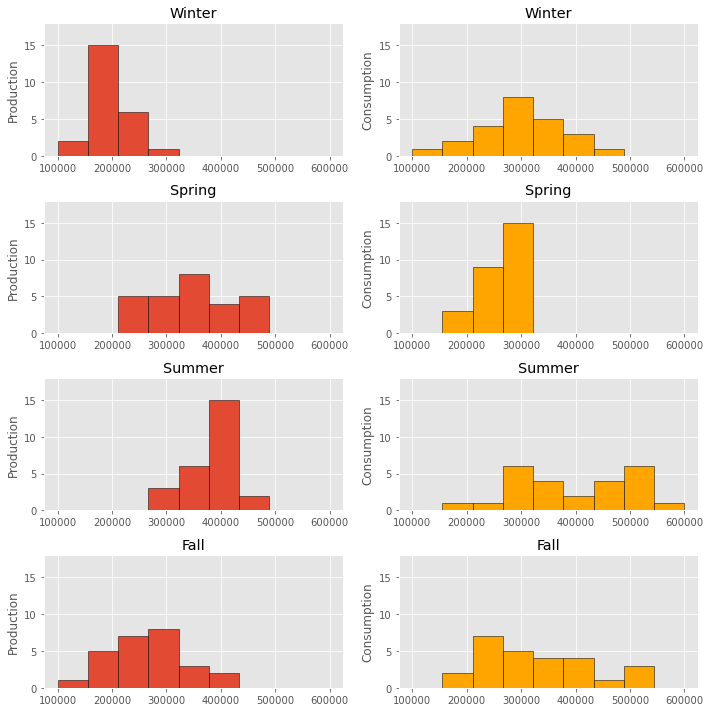

In [91]:
fig, axes = plt.subplots(4,2,figsize=(10,10))
axes[0][0].hist(df_weekly_winter_quarter['prod'].values, bins=bins, edgecolor="k")
axes[0][0].set_title('Winter')
axes[0][0].set_ylabel('Production')
axes[0][0].set_ylim([0,18])


axes[1][0].hist(df_weekly_spring_quarter['prod'].values, bins=bins, edgecolor="k")
axes[1][0].set_title('Spring')
axes[1][0].set_ylabel('Production')
axes[1][0].set_ylim([0,18])

axes[2][0].hist(df_weekly_summer_quarter['prod'].values, bins=bins, edgecolor="k")
axes[2][0].set_title('Summer')
axes[2][0].set_ylabel('Production')
axes[2][0].set_ylim([0,18])

axes[3][0].hist(df_weekly_fall_quarter['prod'].values, bins=bins, edgecolor="k")
axes[3][0].set_title('Fall')
axes[3][0].set_ylabel('Production')
axes[3][0].set_ylim([0,18])


axes[0][1].hist(df_weekly_winter_quarter['cons'].values, bins=bins, edgecolor="k", color='orange')
axes[0][1].set_title('Winter')
axes[0][1].set_ylabel('Consumption')
axes[0][1].set_ylim([0,18])

axes[1][1].hist(df_weekly_spring_quarter['cons'].values, bins=bins, edgecolor="k", color='orange')
axes[1][1].set_title('Spring')
axes[1][1].set_ylabel('Consumption')
axes[1][1].set_ylim([0,18])

axes[2][1].hist(df_weekly_summer_quarter['cons'].values, bins=bins, edgecolor="k", color='orange')
axes[2][1].set_title('Summer')
axes[2][1].set_ylabel('Consumption')
axes[2][1].set_ylim([0,18])

axes[3][1].hist(df_weekly_fall_quarter['cons'].values, bins=bins, edgecolor="k", color='orange')
axes[3][1].set_title('Fall')
axes[3][1].set_ylabel('Consumption')
axes[3][1].set_ylim([0,18])
plt.tight_layout()
plt.show()

I think i'm going to do a max output using the battery max 


- Take in:
    - battery size
    - peak output
    - date range
    
- grab one week
- run battery model over that one week
- count how many times it hit zero
- find lowest battery level of the week 


Possible outputs:
- Expected up-time from battery in outage situation
- Power budget for "emergency" power during outage situations

ideas for modelling power loss situations
1. Worst Case
2. Best Case
3. Median for Hurricane Season
4. Annual Median

New battery sizes:
- 6kWh
- 16kWh
- 20+kWh



In [ ]:
# first row, test charging 

test_df = pd.DataFrame({'prod':[3500,3500,0,0,0,200,2500,2500],
                       'cons':[0,0,3500,3500,3500,0,0,0],
                       'imp':[0,0,0,0,0,0,0,0],
                       'exp':[0,0,0,0,0,0,0,0]})
batt_3kwh = Battery()
batt_3kwh.DEBUG=True
batt_3kwh.set_capacity(800)

utest = batt_3kwh.run_battery_model(test_df)
#plot_model(res_3kwh,title='here')




def test_max_output(df_unit_test):
    batt_3kwh_limitless = Battery()
    batt_3kwh_limitless.set_capacity(3000)
    batt_3kwh_limitless.actual_max_output_15min_wh = 1000000
    res_3kwh_limitless = batt_3kwh_limitless.run_battery_model(df_unit_test)
    
    batt_3kwh = Battery()
    batt_3kwh.set_capacity(3000)
    res_3kwh = batt_3kwh.run_battery_model(df_unit_test)
    
    if (batt_3kwh.actual_max_output_15min_wh <= 0):
        print('Failed default max output')
        return False
    
    if (batt_3kwh_limitless.actual_max_output_15min_wh != 1000000):
        print('Failed setting max output')
        return False
    
    if (batt_3kwh_limitless.cycles_per_year < batt_3kwh.cycles_per_year):
        print('Failed on cycles per year comparison')
        return False
    
    if (res_3kwh.new_import.sum() > res_3kwh_limitless.new_import.sum()):
        print('Failed import comparison')
        return False
    
    percent_decrease_in_savings = \
        100 - ((batt_3kwh.import_cost_savings / batt_3kwh_limitless.import_cost_savings) * 100)
    print('% decrease in savings from adding output max: ',"{:.2f}".format(percent_decrease_in_savings), '%')
    if (percent_decrease_in_savings > 10) | (percent_decrease_in_savings < 0): 
        print('Failed percentage range')
        return False
    
    # TODO: should test a rediculously low max output power to make sure the battery discharge curves are throttled
    
    return True

def test_max_charge(df_unit_test):
    batt_3kwh_limitless = Battery()
    batt_3kwh_limitless.set_capacity(3000)
    batt_3kwh_limitless.max_charge_wh_in_15mins = 1000000
    res_3kwh_limitless = batt_3kwh_limitless.run_battery_model(df_unit_test)
    
    batt_3kwh = Battery()
    batt_3kwh.set_capacity(3000)
    res_3kwh = batt_3kwh.run_battery_model(df_unit_test)
    
    if (batt_3kwh.max_charge_wh_in_15mins <= 0):
        print('Failed default max charge rate')
        return False
    
    if (batt_3kwh_limitless.max_charge_wh_in_15mins != 1000000):
        print('Failed setting max output')
        return False
    
    if (batt_3kwh_limitless.cycles_per_year < batt_3kwh.cycles_per_year):
        print('Failed on cycles per year comparison')
        return False
    
    if (res_3kwh.new_export.sum() > res_3kwh_limitless.new_export.sum()):
        print('Failed import comparison')
        return False
    
    percent_decrease_in_savings = \
        100 - ((batt_3kwh.import_cost_savings / batt_3kwh_limitless.import_cost_savings) * 100)
    print('% decrease in savings from adding max charge rate: ',"{:.2f}".format(percent_decrease_in_savings), '%')
    if (percent_decrease_in_savings > 10) | (percent_decrease_in_savings < 0): 
        print('Failed percentage range')
        return False
    
    # TODO: should test a rediculously low max charge power to make sure the battery discharge curves are throttled
    
    return True

def test_efficiencies(df_unit_test):
    batt_3kwh_efficient = Battery()
    batt_3kwh_efficient.set_capacity(3000)
    batt_3kwh_efficient.charge_eff = 1
    batt_3kwh_efficient.discharge_eff = 1
    
    res_3kwh_efficient = batt_3kwh_efficient.run_battery_model(df_unit_test)
    
    batt_3kwh = Battery()
    batt_3kwh.set_capacity(3000)
    res_3kwh = batt_3kwh.run_battery_model(df_unit_test)
    
    if (batt_3kwh_efficient.import_cost_savings < batt_3kwh.import_cost_savings):
        print('Failed import cost savings comparison test')
        return False
    
    percent_decrease_in_savings = \
        100 - ((batt_3kwh.import_cost_savings / batt_3kwh_efficient.import_cost_savings) * 100)
    
    print('% decrease in savings from adding efficiencies: ',"{:.2f}".format(percent_decrease_in_savings), '%')
    if (percent_decrease_in_savings > 10) | (percent_decrease_in_savings < 0): 
        print('Failed percentage range')
        return False
    
    return True


def test_capacity(df_unit_test):
    
    batt = Battery()
    results_default = batt.run_battery_model(df_unit_test)
    
    if (batt.actual_full_batt_cap != 10080):
        print('Failed default actual_full_batt_cap')
        return False
    
    if (batt.empty_batt_cap != 504): # 10080 x 0.05 = 504
        print('Failed default empty_batt_cap')
        return False
    
    # Change Capacity
    batt.set_capacity(3000)
    results_3kwh = batt.run_battery_model(df_unit_test)
    if (batt.actual_full_batt_cap != 3000):
        print('Failed setting actual_full_batt_cap')
        return False
    
    if (batt.empty_batt_cap != 150): # 3000 x 0.05 = 150
        print('Failed default empty_batt_cap')
        
    if (results_3kwh.curr_batt_level.min() < batt.empty_batt_cap):
        print('Failed: battery over-discharged')
        return False
    
    if (results_3kwh.curr_batt_level.max() > batt.actual_full_batt_cap):
        print('Failed: battery over-charged! level: ',
              results_3kwh.curr_batt_level.max(),
              'max: ',
              batt.actual_full_batt_cap)
        print(results_3kwh.loc[results_3kwh.curr_batt_level == results_3kwh.curr_batt_level.max()])
        print(results_3kwh)
        return False
    
    # TODO: check for exceeding output power max
    # TODO: add a check for exceeding charge power max when implemented
    
    return True

def run_all_unit_test(df_unit_test):
    
    # Max Charge
    print('Testing Max Charge...\n')
    if (test_max_charge(df_unit_test)):
        print('--------------------------------------------------')
        print('Max Charge Tests: PASS')
    else:
        print('--------------------------------------------------')
        print('Max Charge Tests: FAIL')
    print('--------------------------------------------------')
    
    # Max Discharge
    print('Testing Max Discharge...\n')
    if (test_max_output(df_unit_test)):
        print('--------------------------------------------------')
        print('Max Output Tests: PASS')
    else:
        print('--------------------------------------------------')
        print('Max Output Tests: FAIL')
    print('--------------------------------------------------')

    # Efficiencies
    print('Testing Efficiencies...')
    if (test_efficiencies(df_unit_test)):
        print('--------------------------------------------------')
        print('Efficiency Tests: PASS')
    else:
        print('--------------------------------------------------')
        print('Efficiency Tests: FAIL')
    print('--------------------------------------------------')    
        
    # Capacity
    print('Testing Capacity...')
    if (test_capacity(df_unit_test)):
        print('--------------------------------------------------')
        print('Capacity Tests: PASS')
    else:
        print('--------------------------------------------------')
        print('Capacity Tests: FAIL')
    print('--------------------------------------------------\n')
    print('UNIT TESTING COMPLETE')


df_unit_test = raw_df.copy()
run_all_unit_test(df_unit_test)